In [1]:
from PIL import Image
import cv2
import glob as gb
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import scipy

In [2]:
#cargo todos los path de las imagenes
img_melanoma_path = gb.glob("/Users/inma/Desktop/tfg/datos/train/melanoma/*.jpg")

# Usando PIL

In [3]:
img_melanoma_path

['/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000031.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0012435.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0014044.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0014722.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0010587.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0010034.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000555.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0001105.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0014291.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000390.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000151.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000145.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0013844.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0013845.jpg',
 '/Users/inma/Desktop/tfg/datos/train/melanoma/ISIC_0000150.jpg',
 '/Users/i

In [4]:
images_melanoma = []
for path in img_melanoma_path:
    img = Image.open(path)
    images_melanoma.append(img)

In [5]:
images_melanoma[1:5]

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3008x2000 at 0x7F8704F43940>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4288x2848 at 0x7F8704F439A0>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=6602x4402 at 0x7F8704F43A00>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1024x768 at 0x7F8704F43A30>]

In [6]:
images_melanoma[1].show()

In [7]:
type(images_melanoma[1])

PIL.JpegImagePlugin.JpegImageFile

# Usando cv2

In [9]:
images_melanoma_cv2 = []
for path in img_melanoma_path:
    img = cv2.imread(path)
    images_melanoma_cv2.append(img)

In [10]:
images_melanoma_cv2[1:5]

[array([[[168, 168, 182],
         [167, 167, 181],
         [166, 166, 180],
         ...,
         [147, 140, 175],
         [151, 141, 177],
         [151, 141, 177]],
 
        [[165, 165, 179],
         [165, 165, 179],
         [165, 165, 179],
         ...,
         [146, 139, 174],
         [149, 139, 175],
         [149, 139, 175]],
 
        [[165, 165, 179],
         [166, 166, 180],
         [165, 165, 179],
         ...,
         [145, 138, 173],
         [145, 138, 173],
         [145, 138, 173]],
 
        ...,
 
        [[171, 168, 183],
         [170, 167, 182],
         [170, 167, 183],
         ...,
         [157, 157, 173],
         [155, 155, 171],
         [155, 155, 171]],
 
        [[172, 169, 185],
         [169, 166, 182],
         [168, 165, 181],
         ...,
         [156, 156, 172],
         [150, 152, 170],
         [149, 151, 169]],
 
        [[172, 169, 185],
         [169, 166, 182],
         [168, 165, 181],
         ...,
         [155, 155, 171],
  

In [11]:
images_melanoma_cv2[1].shape

(2000, 3008, 3)

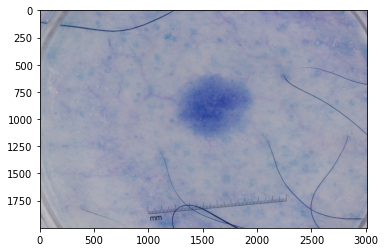

In [12]:
plt.imshow(images_melanoma_cv2[1])
plt.show()

# Tensorflow

## Directorios

In [3]:
train_dir = "/Users/inma/Desktop/tfg/datos/train"
test_dir = "/Users/inma/Desktop/tfg/datos/test"
val_dir = "/Users/inma/Desktop/tfg/datos/valid"

Veamos otra forma de cargar los datos:

### Una sola imagen

In [24]:
imagen = tf.keras.preprocessing.image.load_img("/Users/inma/Desktop/tfg/datos/test/melanoma/ISIC_0012258.jpg")

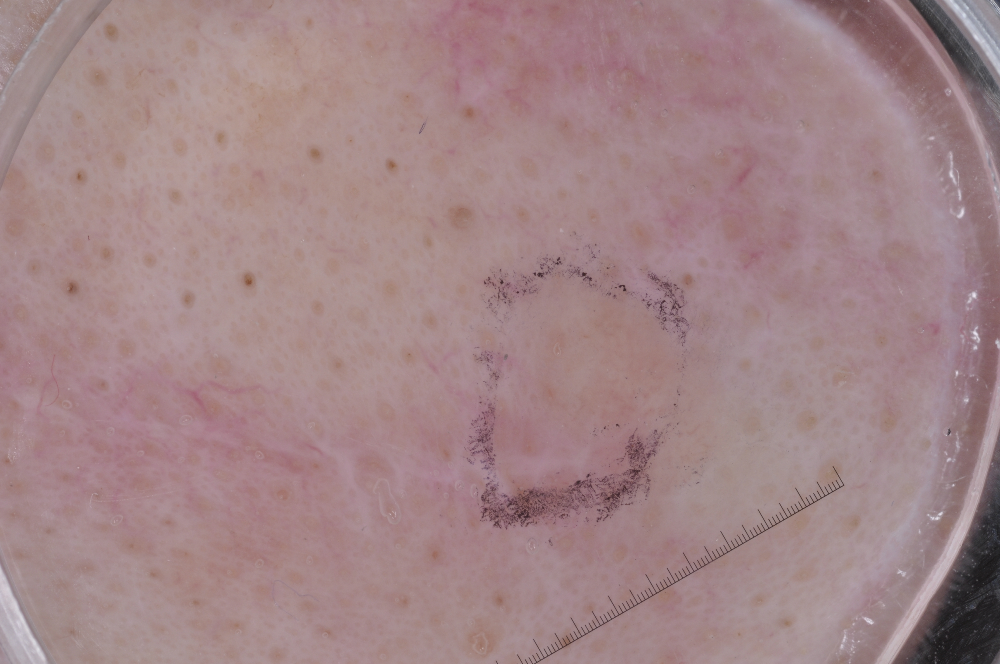

In [5]:
imagen

Obtiene una imagen en formato PIL.

In [25]:
# informacion de la imagen
print("Tamaño de la imagen: ", imagen.size)
print("Modo de la imagen: ", imagen.mode)
print("Fromato de la imagen: ", imagen.format)

Tamaño de la imagen:  (4288, 2848)
Modo de la imagen:  RGB
Fromato de la imagen:  JPEG


El tamaño de esta imagen es de 4288x2848 y tiene 3 canales (RGB).  
El tamaño debe ser 256x256 para la red -> rescale = 1./255

In [26]:
imagen_escalada = imagen.resize((256,256))

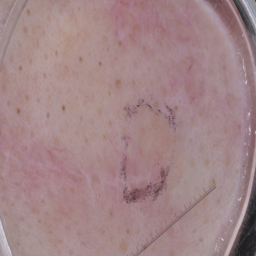

In [8]:
imagen_escalada

In [27]:
print("El tamaño de la imagen es: ", imagen_escalada.size)

El tamaño de la imagen es:  (256, 256)


Podemos transformar la imagen PIL a Numpy array:

In [28]:
imagen_nparray = tf.keras.preprocessing.image.img_to_array(imagen_escalada, data_format=None, dtype=None)
imagen_nparray

array([[[157., 134., 128.],
        [158., 138., 133.],
        [159., 139., 136.],
        ...,
        [148., 148., 157.],
        [134., 134., 143.],
        [ 69.,  71.,  86.]],

       [[157., 136., 132.],
        [158., 139., 136.],
        [158., 138., 133.],
        ...,
        [141., 141., 148.],
        [150., 152., 161.],
        [ 99., 100., 111.]],

       [[160., 140., 139.],
        [159., 140., 138.],
        [158., 138., 134.],
        ...,
        [141., 139., 145.],
        [137., 138., 150.],
        [133., 135., 147.]],

       ...,

       [[161., 142., 150.],
        [160., 144., 154.],
        [165., 155., 162.],
        ...,
        [ 48.,  47.,  49.],
        [ 61.,  58.,  61.],
        [ 95.,  88.,  92.]],

       [[161., 144., 152.],
        [162., 146., 155.],
        [161., 150., 158.],
        ...,
        [ 46.,  44.,  47.],
        [ 77.,  72.,  76.],
        [104.,  97., 102.]],

       [[160., 143., 150.],
        [162., 145., 153.],
        [160., 1

In [ ]:
model = tf.keras.models.load_model('/Users/inma/Desktop/tfg/codigo/modelos/inceptionResNet_model_equilibrado')

In [47]:
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)
test_data = test_gen.flow(imagen,
                                           #target_size = (224,224),
                                           #class_mode = "categorical",
                                           batch_size = 64
                                          )

ValueError: ('Input data in `NumpyArrayIterator` should have rank 4. You passed an array with shape', (2848, 4288, 3))

In [ ]:
prediction = model.predict(image)

### Cargar un dataset desde el directorio

In [73]:
train = tf.keras.preprocessing.image_dataset_from_directory(train_dir, labels='inferred', label_mode='categorical')

Found 2000 files belonging to 3 classes.


In [75]:
type(train)

tensorflow.python.data.ops.dataset_ops.BatchDataset

## Codigo ejemplo

Vamos a realizarlo sin ningún argumento:

In [20]:
train_original = tf.keras.preprocessing.image.ImageDataGenerator()

In [28]:
train_original_data = train_original.flow_from_directory(train_dir)

Found 2000 images belonging to 3 classes.


In [39]:
image, label = train_original_data.next()

In [40]:
print(image.shape)
print(label.shape)

(32, 256, 256, 3)
(32, 3)


Ahora tal cual:

In [14]:
train_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255) # rescale = reducir la dimension
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)
val_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)

In [15]:
# extraer las imagenes de los directorios
train_data = train_gen.flow_from_directory(train_dir,
                                           target_size = (224,224), # nueva escalacion
                                           class_mode = "categorical", # la clase es categorica: melanoma
                                           batch_size = 64 # tamaño del lote ? no lo entiendo muy bien
                                          ) 
test_data = train_gen.flow_from_directory(test_dir,
                                           target_size = (224,224),
                                           class_mode = "categorical",
                                           batch_size = 64
                                          )
val_data = train_gen.flow_from_directory(val_dir,
                                           target_size = (224,224),
                                           class_mode = "categorical",
                                           batch_size = 64
                                          )

Found 2000 images belonging to 3 classes.
Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.


In [82]:
type(train_data)

keras.preprocessing.image.DirectoryIterator

In [16]:
train_data.num_classes

3

In [17]:
label_names = train_data.class_indices.values()

label_names

dict_values([0, 1, 2])

In [18]:
image, label = train_data.next()

print(image.shape)
print(label.shape)

(64, 224, 224, 3)
(64, 3)


- 64 tamaño del lote  
- Tamaño 224x224 píxeles  
- 3 canales: colores RGB

/Users/inma/opt/anaconda3/envs/tfg/lib/python3.8/site-packages/matplotlib/text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


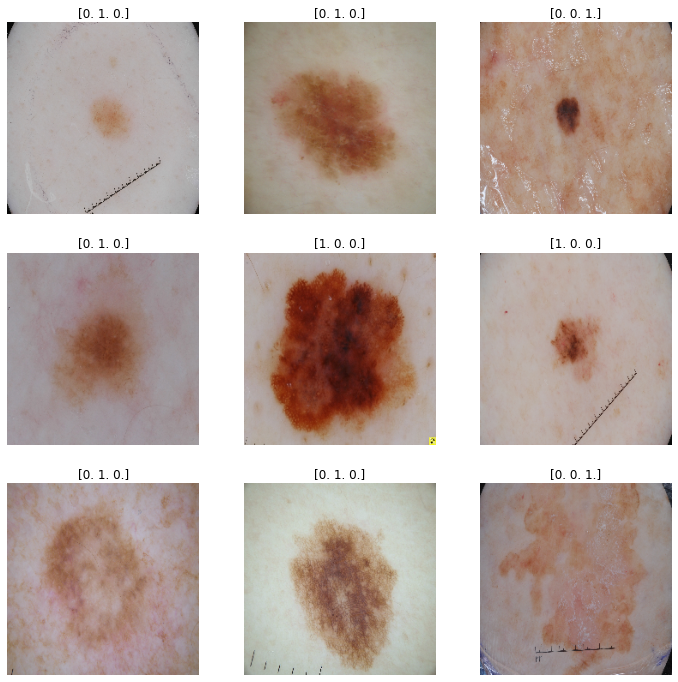

In [19]:
plt.figure(figsize= (12,12))

for i in range(9):
    image,label = train_data.next()
    plt.subplot(3,3, i+1)
    plt.imshow(image[i])
    plt.title(label[i])
    plt.axis("off")

## Crear red convolucional

In [20]:
# building a resnet model
resnet_base = tf.keras.applications.ResNet50V2(include_top= False) # hay muchos modelos

resnet_base.trainable = False # no lo entiendo

2022-03-08 18:42:03.393640: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


94683136/94668760 [==============================] - 113s 1us/step


In [21]:
from tensorflow.keras import layers

inputs = tf.keras.Input(shape=(224,224,3)) # puedo cambiar el tamaño???

x = resnet_base(inputs)
x = layers.GlobalAveragePooling2D()(x) # capa de pooling
x = layers.Dense(128, activation = "relu")(x) # capa muy conectada, con argumento de activacion
# x = layers.Dropout(0.2)(x)
x = layers.Dense(64, activation = "relu")(x) # se repite -> mirar teoría
outputs = layers.Dense(3, activation="softmax")(x)

resnet_model = tf.keras.Model(inputs,outputs) # modelo

In [22]:
# compiling the model

resnet_model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
    metrics = ["accuracy"]
)

In [23]:
# fitting data to the model

resnet_model.fit(train_data,
                 epochs = 5,
                 steps_per_epoch = len(train_data),
                 validation_data = val_data,
                 validation_steps = len(val_data)
                 )

Epoch 1/5
32/32 [==============================] - 344s 11s/step - loss: 0.7807 - accuracy: 0.6805 - val_loss: 0.7932 - val_accuracy: 0.7067
Epoch 2/5
32/32 [==============================] - 330s 10s/step - loss: 0.6014 - accuracy: 0.7475 - val_loss: 0.7776 - val_accuracy: 0.6667
Epoch 3/5
32/32 [==============================] - 344s 11s/step - loss: 0.5268 - accuracy: 0.7845 - val_loss: 0.7779 - val_accuracy: 0.6933
Epoch 4/5
32/32 [==============================] - 331s 10s/step - loss: 0.4664 - accuracy: 0.8200 - val_loss: 0.8427 - val_accuracy: 0.6600
Epoch 5/5
32/32 [==============================] - 332s 10s/step - loss: 0.4236 - accuracy: 0.8385 - val_loss: 0.7609 - val_accuracy: 0.6800


In [24]:
resnet_base.trainable = True

for layer in resnet_base.layers[:-5]:
  resnet_base.trainable = False

resnet_model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(learning_rate= 0.001),
    metrics = ["accuracy"]
)

In [25]:
# fitting data to the tuned model

resnet_model.fit(train_data,
                 epochs = 5,
                 steps_per_epoch = len(train_data),
                 validation_data = val_data,
                 validation_steps = len(val_data)
                 )

Epoch 1/5
32/32 [==============================] - 338s 10s/step - loss: 0.3880 - accuracy: 0.8505 - val_loss: 0.7984 - val_accuracy: 0.6600
Epoch 2/5
32/32 [==============================] - 317s 10s/step - loss: 0.2932 - accuracy: 0.8860 - val_loss: 1.0624 - val_accuracy: 0.6733
Epoch 3/5
32/32 [==============================] - 320s 10s/step - loss: 0.2439 - accuracy: 0.9180 - val_loss: 1.0560 - val_accuracy: 0.5867
Epoch 4/5
32/32 [==============================] - 327s 10s/step - loss: 0.2131 - accuracy: 0.9250 - val_loss: 1.0987 - val_accuracy: 0.6800
Epoch 5/5
32/32 [==============================] - 326s 10s/step - loss: 0.1802 - accuracy: 0.9405 - val_loss: 1.0593 - val_accuracy: 0.6800


In [26]:
resnet_model_evaluation = resnet_model.evaluate(test_data)

10/10 [==============================] - 215s 21s/step - loss: 0.9253 - accuracy: 0.7117


In [27]:
print(f"Resnet Model Accuarcy : {resnet_model_evaluation[1] *100 : 0.2f}%")

Resnet Model Accuarcy :  71.17%


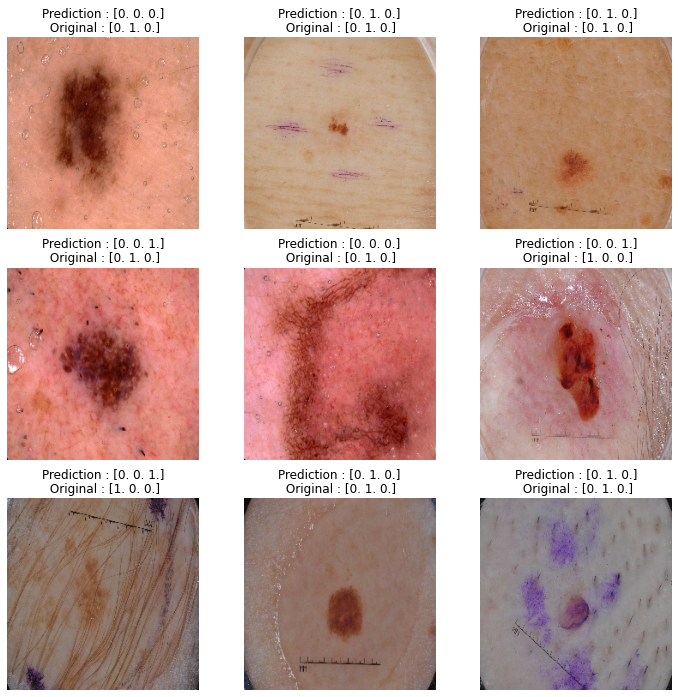

In [28]:
# visualizing the prediting image

import matplotlib.pyplot as plt
import tensorflow as tf


plt.figure(figsize=(12,12))

for i in range(9):
  image, label = test_data.next()

  resnet_model_prediction = resnet_model.predict(image)
  
  plt.subplot(3,3,i+1)

  plt.imshow(image[i])
  plt.title(f"Prediction : {tf.round(resnet_model_prediction[i])}\n Original : {label[i]}")
  plt.axis("off")